In [1]:
import pandas as pd
import numpy as np

In [2]:
#Дата сет был трансформирован в экселе - проведен feature eng 
#расчитаны три новые фичи : угол наклона кривой, станд отклонение, медиана 
#так же отфильтрованы клиенты по возрастанию и удалены три фичи 'F23', 'F33' , 'F34

Train = pd.read_excel("D:\Python\Task_BigDataSchool\BigDataSchool3\BigDataSchool_features1.xlsx", decimal = ",")

In [3]:
pd.set_option('display.max_columns', 500)

In [4]:
pd.set_option('display.max_rows', 1000)

In [5]:
Train

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F7slope,F8slope,F9slope,F10slope,F11slope,F12slope,F13slope,F14slope,F15slope,F16slope,F17slope,F18slope,F19slope,F20slope,F21slope,F22slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F7dev,F8dev,F9dev,F10dev,F11dev,F12dev,F13dev,F14dev,F15dev,F16dev,F17dev,F18dev,F19dev,F20dev,F21dev,F22dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F35dev,F36dev,F37dev,F38dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F7med,F8med,F9med,F10med,F11med,F12med,F13med,F14med,F15med,F16med,F17med,F18med,F19med,F20med,F21med,F22med,F24med,F26med,F27med,F28med,F29med,F30med,F31med,F32med,F35med,F36med,F37med,F38med,F39med,F40med,F41med,F42med,F43med,F44med,F45med,F46med,F47med
0,1,0.000000,1.0,2.257143,2.285714e-01,0.000000,20.404000,18.173143,1.890286e+00,1.881757,3.389429,0.872000,28.700000,20.554054,1.200000e+00,3.600000,1.885714e+00,8.571429e-02,4.883721e+00,6.216216e-01,2.592286,7.562571e-02,0.000000,0.000000,-2.028571e+00,-6.756757e-02,0.400000,0.685714,0.000000e+00,0.000000e+00,-1.0,4.527027,-2.959459e+00,-5.714286e-02,10.514286,1.714286,-1.714286e-01,-1.142857e-01,1.714286e-01,0.514286,-0.244186,0.000000,2.285714e-01,61.175676,0.000000,2.073644,6.090977,1.032796,0.000000,62.721373,55.987727,17.142441,34.817318,33.543282,9.065386,52.869651,44.257203,19.085771,14.859340,8.594572,7.026142,10.954451,2.489980,16.968974,1.019076,0.000000,0.000000,12.802344,12.389512,7.527727,4.226898,0.000000,0.000000,1.581139,21.575449,16.361540,2.065591,35.844107,4.898979,1.095445,0.516398,0.816497,1.095445,0.547723,0.000000,0.516398,159.054393,9.0,140.0,18.5,0.0,0.0,52.730,27.620,19.115,83.670,63.285,29.475,60.0,41.0,25.0,81.0,53.5,30.5,0.000,2.000,25.560,0.000000,0.000000,0.0,7.0,23.0,26.5,29.0,0.0,0.0,4.0,99.0,32.0,10.0,71.0,147.0,1.0,2.0,2.5,1.0,1.0,0.0,2.0,341.0
1,2,-0.857143,1.0,0.604651,6.900000e+00,0.000000,112.405000,86.669714,-1.710286e+00,-34.598286,-35.634000,1.037143,4.700000,13.914286,-1.621622e-01,-6.000000,-7.628571e+00,1.628571e+00,4.000000e+00,-9.142857e-01,5.855143,1.711741e+01,0.000000,0.000000,0.000000e+00,-4.972973e+00,-4.771429,-0.742857,0.000000e+00,0.000000e+00,-1.0,11.400000,-3.800000e+00,8.571429e-01,27.485714,9.743243,-2.432432e-01,-6.000000e-01,-5.142857e-01,-0.228571,0.000000,0.000000,-5.714286e-02,68.283784,2.309401,1.870829,2.387467,12.589678,0.000000,199.729784,190.796915,5.705912,131.600694,130.963949,3.694870,15.270887,28.780202,2.880972,43.039517,41.470070,4.915960,21.908902,4.131182,23.709204,117.626355,0.000000,0.000000,0.000000,15.093045,13.765900,9.500877,0.000000,0.000000,1.870829,33.731291,42.150919,1.751190,65.807801,30.760364,0.894427,1.169045,1.032796,0.516398,0.000000,0.000000,0.632456,159.777345,6.0,130.5,28.0,7.0,0.0,430.130,451.725,2.700,265.205,264.055,3.850,156.0,139.5,3.0,89.0,85.0,6.0,40.000,0.000,48.750,197.264449,0.000000,0.0,0.0,5.0,6.0,24.0,0.0,0.0,3.5,99.0,138.0,1.5,47.0,114.0,0.0,3.0,3.0,1.0,0.0,0.0,2.0,919.0
2,3,0.000000,1.0,0.285714,-1.742857e+00,0.000000,-20.963143,64.498286,-6.305714e-01,18.074571,18.088286,-0.013714,0.114286,2.428571,-3.142857e-01,-1.028571,-9.714286e-01,-5.714286e-02,2.700000e+00,-2.857143e-01,3.669651,-9.326431e+01,-60.163450,0.000000,0.000000e+00,-1.662791e+00,-0.800000,0.057143,0.000000e+00,0.000000e+00,-1.0,-2.085714,3.285714e+00,1.428571e-01,-4.542857,-15.100000,0.000000e+00,0.000000e+00,8.571429e-02,0.000000,0.000000,0.000000,4.186047e-01,-420.391892,0.000000,1.870829,1.211060,6.892024,0.000000,94.685217,248.128931,3.266769,173.606064,173.603775,0.116733,22.730303,21.958294,2.562551,23.191953,22.689204,0.816497,8.485281,0.816497,13.023129,262.838529,190.796083,0.000000,0.000000,8.927486,6.396614,3.881580,0.000000,0.000000,1.581139,20.232812,11.588788,1.169045,14.770466,26.696442

In [6]:
print(Train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17195 entries, 0 to 17194
Columns: 130 entries, ID to F47med
dtypes: float64(129), int64(1)
memory usage: 17.1 MB
None


In [7]:
Train.describe()

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F7slope,F8slope,F9slope,F10slope,F11slope,F12slope,F13slope,F14slope,F15slope,F16slope,F17slope,F18slope,F19slope,F20slope,F21slope,F22slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F7dev,F8dev,F9dev,F10dev,F11dev,F12dev,F13dev,F14dev,F15dev,F16dev,F17dev,F18dev,F19dev,F20dev,F21dev,F22dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F35dev,F36dev,F37dev,F38dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F7med,F8med,F9med,F10med,F11med,F12med,F13med,F14med,F15med,F16med,F17med,F18med,F19med,F20med,F21med,F22med,F24med,F26med,F27med,F28med,F29med,F30med,F31med,F32med,F35med,F36med,F37med,F38med,F39med,F40med,F41med,F42med,F43med,F44med,F45med,F46med,F47med
count,17195.000000,17195.000000,1.719500e+04,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,1.719500e+04,17120.000000,17105.000000,16092.000000,16093.000000,15778.000000,15778.000000,15778.000000,15778.000000,15233.000000,15244.000000,15253.000000,15595.000000,15594.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17120.000000,17105.000000,16092.000000,16093.000000,15778.000000,15778.000000,15778.000000,15778.000000,15233.000000,15244.000000,15253.000000,15595.000000,15594.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.00000,17195.000000,17195.000000,17195.000000,17187.000000,17192.000000,16396.000000,16402.000000,16055.000000,16049.000000,16047.000000,16056.000000,15581.000000,15585.000000,15586.000000,15850.000000,15858.000000
mean,10305.461413,0.005574,1.000000e+00,0.002395,0.101733,0.000289,3.290091,2.612299,0.434223,4.386508,4.325759,0.388510,-0.195832,-0.266814,0.181875,0.434399,0.218944,0.193402,0.926548,0.023868,0.881040,38.311609,40.608667,-0.000024,-0.020067,-0.008309,0.047561,0.012369,0.030232,0.010848,-1.000000e+00,0.596739,-0.459245,0.291109,5.478558,0.724319,-0.003899,-0.015605,-0.036217,-0.010105,0.016088,0.002326,-0.003313,78.148594,0.347975,1.867157,3.110585,2.840588,0.041527,164.923692,160.944746,7.874997,147.977025,143.906719,10.545357,49.141851,45.427942,4.670021,40.513948,38.327074,5.311006,9.528473,2.999929,21.016111,290.819344,258.617576,0.009407,1.941510,5.296982,5.230458,4.942667,1.519693,0.403130,1.868242,41.204728,27.521761,1.383819,21.527185,22.004582,0.633844,0.848313,0.985142,0.120854,0.089688,0.014887,0.366543,859.298087,12.070893,73.006659,21.353678,6.827566,0.026752,393.615676,378.232263,8.527230,378.219862,359.925988,11.790845,166.078424,150.636551,6.602239,144.172027,134.004071,8.737278,23.639372,1.683915,44.115621,346.953224,274.208133,0.001309,4.507066,13.593021,18.973161,22.00724,1.085839,0.222536,3.498372,157.720254,74.483306,3.273207,41.944245,103.449081,0.798959,1.591731,2.360519,0.727553,0.645557,0.067304,1.170442,1506.632772
std,5499.511939,0.455350,5.273970e-17,1.573757,1.744529,0.040038,99.343427,9

In [8]:
Train.isnull().sum()

ID             0
F1slope        0
F2slope        0
F3slope        0
F4slope        0
F5slope        0
F6slope        0
F7slope        0
F8slope        0
F9slope        0
F10slope       0
F11slope       0
F12slope       0
F13slope       0
F14slope       0
F15slope       0
F16slope       0
F17slope       0
F18slope       0
F19slope       0
F20slope       0
F21slope       0
F22slope       0
F24slope       0
F26slope       0
F27slope       0
F28slope       0
F29slope       0
F30slope       0
F31slope       0
F32slope       0
F35slope      75
F36slope      90
F37slope    1103
F38slope    1102
F39slope    1417
F40slope    1417
F41slope    1417
F42slope    1417
F43slope    1962
F44slope    1951
F45slope    1942
F46slope    1600
F47slope    1601
F1dev          0
F2dev          0
F3dev          0
F4dev          0
F5dev          0
F6dev          0
F7dev          0
F8dev          0
F9dev          0
F10dev         0
F11dev         0
F12dev         0
F13dev         0
F14dev         0
F15dev        

In [9]:
Train.count()

ID          17195
F1slope     17195
F2slope     17195
F3slope     17195
F4slope     17195
F5slope     17195
F6slope     17195
F7slope     17195
F8slope     17195
F9slope     17195
F10slope    17195
F11slope    17195
F12slope    17195
F13slope    17195
F14slope    17195
F15slope    17195
F16slope    17195
F17slope    17195
F18slope    17195
F19slope    17195
F20slope    17195
F21slope    17195
F22slope    17195
F24slope    17195
F26slope    17195
F27slope    17195
F28slope    17195
F29slope    17195
F30slope    17195
F31slope    17195
F32slope    17195
F35slope    17120
F36slope    17105
F37slope    16092
F38slope    16093
F39slope    15778
F40slope    15778
F41slope    15778
F42slope    15778
F43slope    15233
F44slope    15244
F45slope    15253
F46slope    15595
F47slope    15594
F1dev       17195
F2dev       17195
F3dev       17195
F4dev       17195
F5dev       17195
F6dev       17195
F7dev       17195
F8dev       17195
F9dev       17195
F10dev      17195
F11dev      17195
F12dev    

In [10]:
from feature_selector import FeatureSelector

In [11]:
fs = FeatureSelector(data = Train)

No labels provided. Feature importance based methods are not available.


In [12]:
fs.identify_missing(missing_threshold = 0.6)

0 features with greater than 0.60 missing values.



In [13]:
fs.missing_stats.head()

,missing_fraction
F43slope,0.114103
F43dev,0.114103
F44dev,0.113463
F44slope,0.113463
F45slope,0.112940


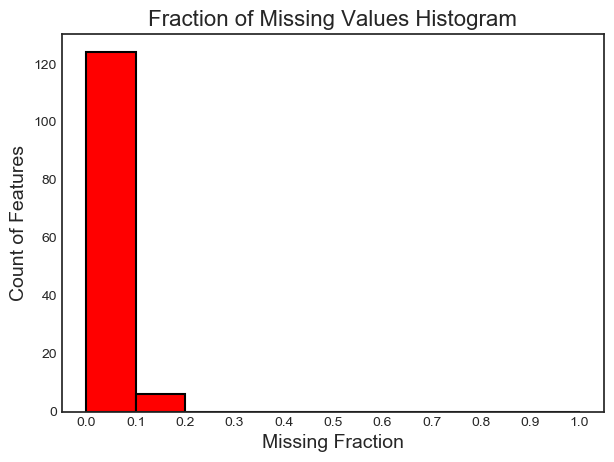

In [14]:
fs.plot_missing()

In [15]:
fs.identify_collinear(correlation_threshold=0.8)

25 features with a correlation magnitude greater than 0.80.



In [16]:
correlated_features = fs.ops['collinear']
correlated_features[:25]

['F7slope',
 'F10slope',
 'F13slope',
 'F16slope',
 'F22slope',
 'F7dev',
 'F10dev',
 'F13dev',
 'F16dev',
 'F22dev',
 'F35dev',
 'F38dev',
 'F7med',
 'F10med',
 'F13med',
 'F14med',
 'F15med',
 'F16med',
 'F17med',
 'F22med',
 'F28med',
 'F29med',
 'F35med',
 'F38med',
 'F42med']

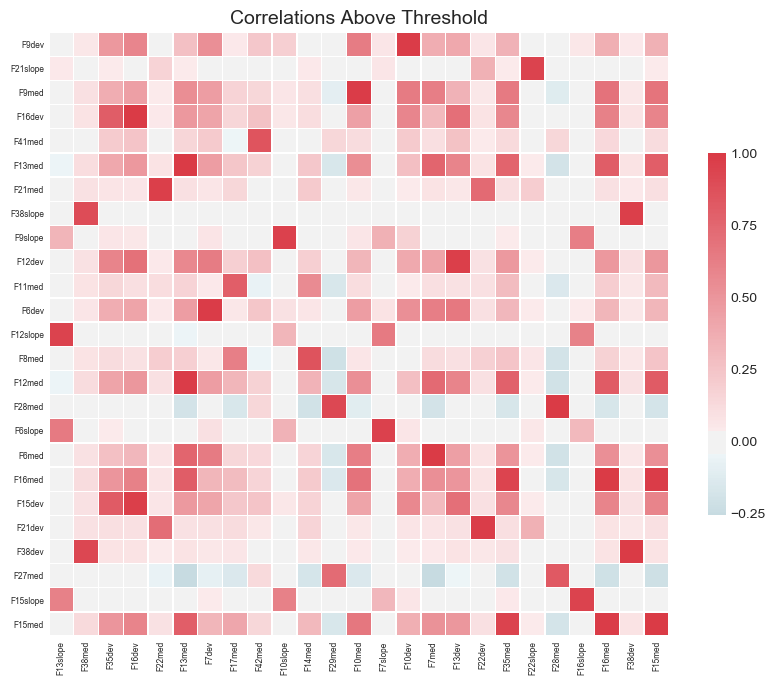

In [17]:
fs.plot_collinear()

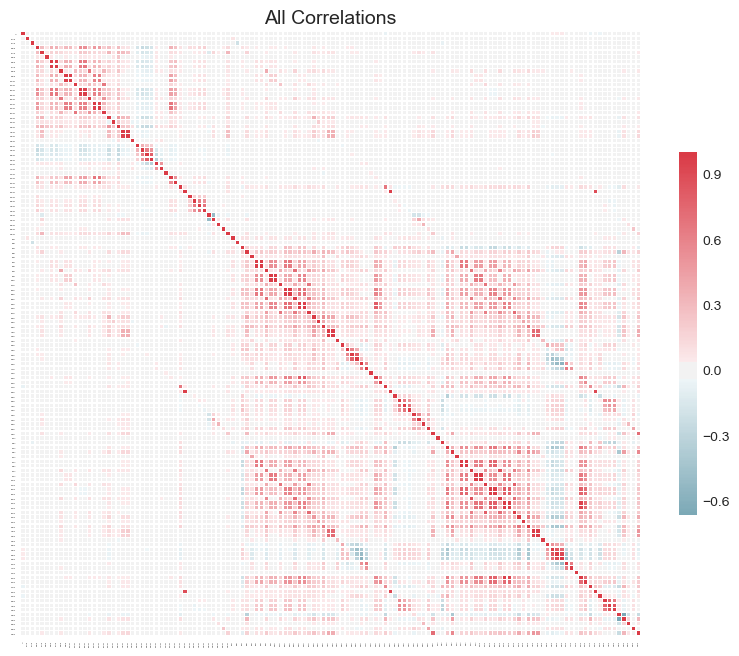

In [18]:
fs.plot_collinear(plot_all=True)

In [19]:
collinear_features = fs.ops['collinear']
fs.record_collinear

,drop_feature,corr_feature,corr_value
0,F7slope,F6slope,0.955622
1,F10slope,F9slope,0.954217
2,F13slope,F12slope,0.947204
3,F16slope,F15slope,0.946971
4,F22slope,F21slope,0.944093
5,F7dev,F6dev,0.984968
6,F10dev,F9dev,0.980542
7,F13dev,F12dev,0.966914
8,F16dev,F15dev,0.968070
9,F22dev,F21dev,0.979840


In [20]:
columns = ['F7slope',
 'F10slope',
 'F13slope',
 'F16slope',
 'F22slope',
 'F7dev',
 'F10dev',
 'F13dev',
 'F16dev',
 'F22dev',
 'F35dev',
 'F38dev',
 'F7med',
 'F10med',
 'F13med',
 'F14med',
 'F15med',
 'F16med',
 'F17med',
 'F22med',
 'F28med',
 'F29med',
 'F35med',
 'F38med',
 'F42med']
Train.drop(columns, axis=1, inplace=True)

In [21]:
Train.isnull().sum()

ID             0
F1slope        0
F2slope        0
F3slope        0
F4slope        0
F5slope        0
F6slope        0
F8slope        0
F9slope        0
F11slope       0
F12slope       0
F14slope       0
F15slope       0
F17slope       0
F18slope       0
F19slope       0
F20slope       0
F21slope       0
F24slope       0
F26slope       0
F27slope       0
F28slope       0
F29slope       0
F30slope       0
F31slope       0
F32slope       0
F35slope      75
F36slope      90
F37slope    1103
F38slope    1102
F39slope    1417
F40slope    1417
F41slope    1417
F42slope    1417
F43slope    1962
F44slope    1951
F45slope    1942
F46slope    1600
F47slope    1601
F1dev          0
F2dev          0
F3dev          0
F4dev          0
F5dev          0
F6dev          0
F8dev          0
F9dev          0
F11dev         0
F12dev         0
F14dev         0
F15dev         0
F17dev         0
F18dev         0
F19dev         0
F20dev         0
F21dev         0
F24dev         0
F26dev         0
F27dev        

In [22]:
Train_label = pd.read_csv("D:\Python\Task_BigDataSchool\BigDataSchool3\BigDataSchool_train_set.csv", sep=",")

In [23]:
Train_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12890 entries, 0 to 12889
Data columns (total 2 columns):
ID        12890 non-null int64
TARGET    12890 non-null float64
dtypes: float64(1), int64(1)
memory usage: 201.5 KB


In [24]:
Train_label

,ID,TARGET
0,2,0.0
1,4,0.0
2,5,0.0
3,8,0.0
4,9,0.0
5,10,0.0
6,11,0.0
7,13,0.0
8,14,0.0
9,15,0.0


In [25]:
print(Train_label['TARGET'].value_counts(dropna=False).tail(10))
#Дисбаланс классов

0.0    11848
1.0     1042
Name: TARGET, dtype: int64


In [26]:
data = Train.merge(Train_label)

In [27]:
data.describe()

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F8slope,F9slope,F11slope,F12slope,F14slope,F15slope,F17slope,F18slope,F19slope,F20slope,F21slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F8dev,F9dev,F11dev,F12dev,F14dev,F15dev,F17dev,F18dev,F19dev,F20dev,F21dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F36dev,F37dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F8med,F9med,F11med,F12med,F18med,F19med,F20med,F21med,F24med,F26med,F27med,F30med,F31med,F32med,F36med,F37med,F39med,F40med,F41med,F43med,F44med,F45med,F46med,F47med,TARGET
count,12890.000000,12890.000000,1.289000e+04,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,1.289000e+04,12837.000000,12820.000000,12074.000000,12078.000000,11840.000000,11844.000000,11843.000000,11842.000000,11437.000000,11443.000000,11453.000000,11709.00000,11703.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12820.000000,12074.000000,11840.000000,11844.000000,11843.000000,11842.000000,11437.000000,11443.000000,11453.000000,11709.000000,11703.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12890.000000,12888.000000,12301.000000,12056.000000,12048.000000,12050.000000,11701.000000,11704.000000,11703.000000,11896.000000,11905.000000,12890.000000
mean,10329.125446,0.011781,1.000000e+00,-0.000403,0.101047,0.000375,2.544798,0.435682,4.342896,0.374383,-0.278046,0.195444,0.409032,0.184079,0.947973,0.012613,0.854553,40.683493,0.000004,-0.009506,0.004998,0.056992,0.023397,0.024237,0.011571,-1.000000e+00,0.745015,-0.287297,0.298298,5.682191,0.723884,-0.002673,-0.013400,-0.034142,-0.010254,0.016073,0.002231,-0.00595,84.256082,0.344990,1.865960,3.115222,2.822772,0.041414,164.904847,8.053103,148.615697,10.705696,49.405104,4.738058,40.779955,5.397265,9.546290,3.032695,21.179342,297.994171,0.009807,1.931006,5.316577,5.224940,4.925284,1.515939,0.409181,1.869284,27.600277,1.401656,22.079672,0.636251,0.848876,0.985493,0.121622,0.089289,0.014692,0.364990,875.586422,12.087238,72.833476,21.359542,6.874631,0.027153,393.078935,8.655572,378.973569,12.033273,165.886346,23.706149,1.711536,44.356854,357.808715,0.001474,4.517649,13.646509,1.087898,0.223933,3.497711,74.719507,3.292740,103.204172,0.791750,1.586805,0.720109,0.653623,0.068273,1.162239,1524.073247,0.080838
std,5499.305410,0.459197,5.197684e-17,1.581680,1.732082,0.040551,100.540130,7.083965,85.653745,7.530177,25.213621,3.211767,19.933529,3.239243,4.977071,2.141938,10.536122,369.526795,0.017026,1.524593,2.272130,2.121644,1.997341,1.031132,0.558061,3.911656e-18,27.838600,20.271450,0.701854,55.452212,11.091948,0.345782,0.423828,0.465159,0.152049,0.112400,0.040448,0.24448,1009.695675,1.337217,0.118885,3.037390,3.780278,0.133310,223.460180,18.556350,193.940802,21.456000,50.392288,8.275030,39.103198,7.870515,13.091708,6.715022,27.102831,1037.043932,0.065399,3.718537,4.402439,4.058507,3.930605,2.997762,1.715058,0.116639,45.084769,1.363791,16.572943,0.540019,0.568788,0.570087,0.297872,0.219638,0.084513,0.486503,2309.284292,6.553108,49.352927,10.856113,10.787910,0.156082,508.362803,25.245813,421.456953,30.0658

In [28]:
import matplotlib.pyplot as plot
import sklearn
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, StratifiedKFold
import catboost
from catboost import CatBoostClassifier, Pool

In [29]:
y = data.TARGET
X = data.drop(['TARGET', 'ID'], axis=1, inplace=True)

In [30]:
X_train, X_valid, y_train, y_valid = train_test_split(data.values, y, test_size=0.3,
random_state=1234)

In [31]:
#заполним пропуски после разбиения на тренировочную и обучающую выборки
X_train = pd.DataFrame(X_train)
X_valid = pd.DataFrame(X_valid)

In [32]:
X_train.isnull().sum()

0         0
1         0
2         0
3         0
4         0
5         0
6         0
7         0
8         0
9         0
10        0
11        0
12        0
13        0
14        0
15        0
16        0
17        0
18        0
19        0
20        0
21        0
22        0
23        0
24        0
25       33
26       51
27      577
28      573
29      739
30      735
31      733
32      737
33     1016
34     1009
35     1003
36      825
37      831
38        0
39        0
40        0
41        0
42        0
43        0
44        0
45        0
46        0
47        0
48        0
49        0
50        0
51        0
52        0
53        0
54        0
55        0
56        0
57        0
58        0
59        0
60        0
61        0
62        0
63       51
64      577
65      739
66      735
67      733
68      737
69     1016
70     1009
71     1003
72      825
73      831
74        0
75        0
76        0
77        0
78        0
79        0
80        0
81        0
82        0
83  

In [33]:
X_valid.isnull().sum()

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25      20
26      19
27     239
28     239
29     311
30     311
31     314
32     311
33     437
34     438
35     434
36     356
37     356
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       0
48       0
49       0
50       0
51       0
52       0
53       0
54       0
55       0
56       0
57       0
58       0
59       0
60       0
61       0
62       0
63      19
64     239
65     311
66     311
67     314
68     311
69     437
70     438
71     434
72     356
73     356
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0
90       0

In [34]:
#импутация пропусков
for i in [25,26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 63, 64, 65, 66, 67, 68, 
          69, 70, 71, 72, 73, 74, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]:
    if i in X_train.columns:
         X_train[i].fillna(X_train[i].median(), inplace=True)
for i in  [25,26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 63, 64, 65, 66, 67, 68, 
          69, 70, 71, 72, 73, 74, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104]:
    if i in X_valid.columns:
        X_valid[i].fillna(X_train[i].median(), inplace=True)
        
        #проверим отсутствие пропусков код выше

In [35]:
# импортируем класс RandomOverSampler

from imblearn.over_sampling import RandomOverSampler

In [36]:
# устраняем дисбаланс классов  создаем экземпляр класса RandomOverSampler
ros = RandomOverSampler(ratio={0:11848, 1:1042}, random_state=42)
# обучаем модель RandomOverSampler, т.е. выполняем семплинг, 
# создав новые наборы данных
X_resampled, y_resampled = ros.fit_sample(X_train, y_train)
# Спойлер не помогло Кат бусту ухудшило немного АУС на 1% лучше на 0,1% в ЛОгРег

C:\Users\User\Anaconda3\lib\site-packages\imblearn\utils\validation.py:224: UserWarning: After over-sampling, the number of samples (11848) in class 0 will be larger than the number of samples in the majority class (class #0.0 -> 8286)
  n_samples_majority))


In [58]:
# устраняем дисбаланс классов 2 способ импортируем класс SMOTE
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=152, kind='borderline2',
n_jobs=-1)
X_smote, y_smote = smote.fit_sample(X_train, y_train)

In [50]:
#Базовый Catboost
model = CatBoostClassifier(
    eval_metric='AUC',
    depth = 8,
    random_seed=42,
    loss_function='Logloss',
    logging_level='Silent'
)

In [38]:
#Базовый Catboost
model.fit(
      X_resampled, y_resampled, 
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

Learning rate set to 0.102053


MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [51]:
model.fit(
      X_train, y_train, 
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

Learning rate set to 0.098302


MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [39]:
from sklearn.metrics import roc_auc_score

In [40]:

# печатаем значение AUC для контрольной выборки
print('AUC модели на обучающей выборке: {:.3}'.format(
    roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])))
print('AUC модели на контрольной выборке: {:.3}'.format(
    roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1])))

AUC модели на обучающей выборке: 0.906
AUC модели на контрольной выборке: 0.761


In [55]:
#Подкрученый Catboost
modelup = CatBoostClassifier(
         logging_level='Silent',
         iterations=1000, depth=8, 
         learning_rate=0.01, 
         loss_function='Logloss',
         random_strength= 0.1,
         bagging_temperature=0.1,
         eval_metric =  'AUC', 
         l2_leaf_reg= 30, 
         use_best_model = True,
         random_seed = 17)

In [56]:
 modelup.fit(
      X_train, y_train,
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [57]:
print('AUC модели на обучающей выборке: {:.3}'.format(
    roc_auc_score(y_train, modelup.predict_proba(X_train)[:, 1])))
print('AUC модели на контрольной выборке: {:.3}'.format(
    roc_auc_score(y_valid, modelup.predict_proba(X_valid)[:, 1])))
#лучший результат

AUC модели на обучающей выборке: 0.888
AUC модели на контрольной выборке: 0.771


In [59]:
#хуже при использовании оверсэмплинга
modelup.fit(
      X_smote, y_smote,
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [78]:
#Важность признаков метод get_feature_importance
train_pool = Pool(X_train, y_train)    
    
    
model = CatBoostClassifier(
         logging_level='Silent',
         iterations=300, depth=8, 
         learning_rate=0.1, 
         loss_function='Logloss',
         random_strength= 0.1,
         bagging_temperature=0.1,
         eval_metric =  'AUC', 
         l2_leaf_reg= 30, 
         use_best_model = True,
         random_seed = 17).fit(train_pool,  eval_set=(X_valid, y_valid), 
      use_best_model=True)
feature_importances = model.get_feature_importance(train_pool)
feature_names = Train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse = True):
    print('{}: {}'.format(name, score))

F1med: 13.507154099799468
F26med: 5.210867257586964
F41med: 4.034231664961327
F12med: 3.5847768716887933
F32dev: 3.0826861158743504
F8med: 2.948429516173199
F39med: 2.8001730307986397
F2med: 2.600411710255303
F32med: 2.4683419838879948
F40med: 2.188209047678696
F27dev: 2.1838333757691486
F11dev: 2.1650674267771604
F24med: 2.0135185795351
F37med: 1.8792448342266768
F5slope: 1.7857758017004937
F45dev: 1.680615757434385
F19med: 1.6783795876626662
F37dev: 1.666527608319492
F37slope: 1.5808202853219222
F45med: 1.4900529042047934
F6slope: 1.4281370874786208
F5med: 1.346827701387883
F2slope: 1.133354120018428
F19slope: 1.118953585179749
F3dev: 1.114056897322933
F15slope: 1.108873647612012
F15dev: 1.0981362593761332
F41dev: 1.0590651435693559
F26slope: 1.037556610336562
F18med: 1.0338829443197421
F40dev: 0.9771470964158748
F26dev: 0.9628857259289281
F5dev: 0.9570962064291897
F6med: 0.9534553492120605
F8dev: 0.9247905003426204
F18slope: 0.9215072114426459
F9med: 0.8992904975955069
F20slope: 0.8

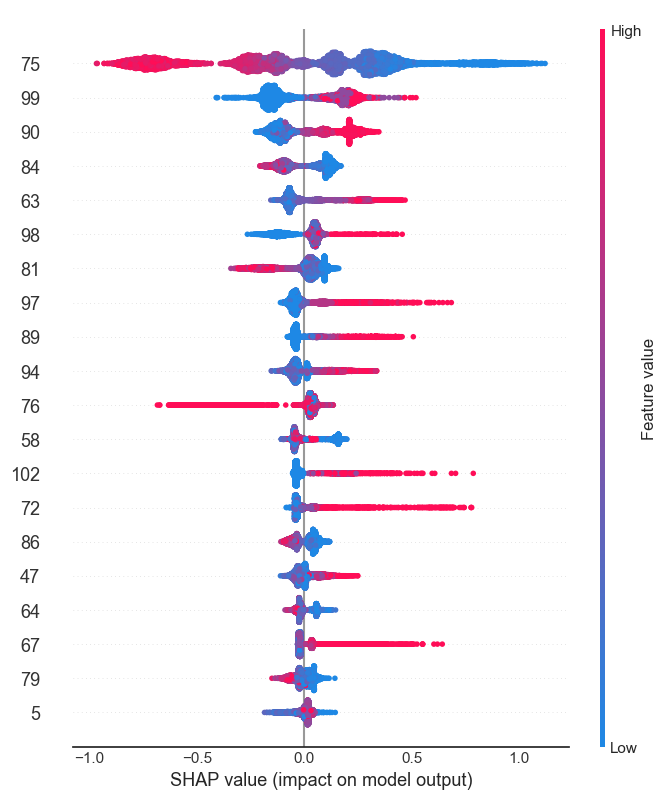

In [83]:
import shap
shap_values = model.get_feature_importance(train_pool, fstr_type='ShapValues')
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_pool)
shap.summary_plot(shap_values, X_train)

In [48]:
# импортируем класс LogisticRegression
from sklearn.linear_model import LogisticRegression
# создаем экземпляр класса LogisticRegression
# и подгоняем модель
logreg = LogisticRegression().fit(X_resampled, y_resampled,)
# оцениваем дискриминирующую способность 
# модели логистической регрессии
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_resampled, logreg.predict_proba(X_resampled)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 0.764
AUC на контрольной выборке: 0.766


In [60]:

logreg = LogisticRegression().fit(X_smote, y_smote)
# оцениваем дискриминирующую способность 
# модели логистической регрессии
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_smote, logreg.predict_proba(X_smote)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))

# хуже чем 1 способ оверсэмплинга но лучше в целом чем без

AUC на обучающей выборке: 0.789
AUC на контрольной выборке: 0.760


In [61]:
logreg = LogisticRegression().fit(X_train, y_train)
# оцениваем дискриминирующую способность 
# модели логистической регрессии
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, logreg.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 0.766
AUC на контрольной выборке: 0.765


In [62]:
from pandas.plotting import scatter_matrix

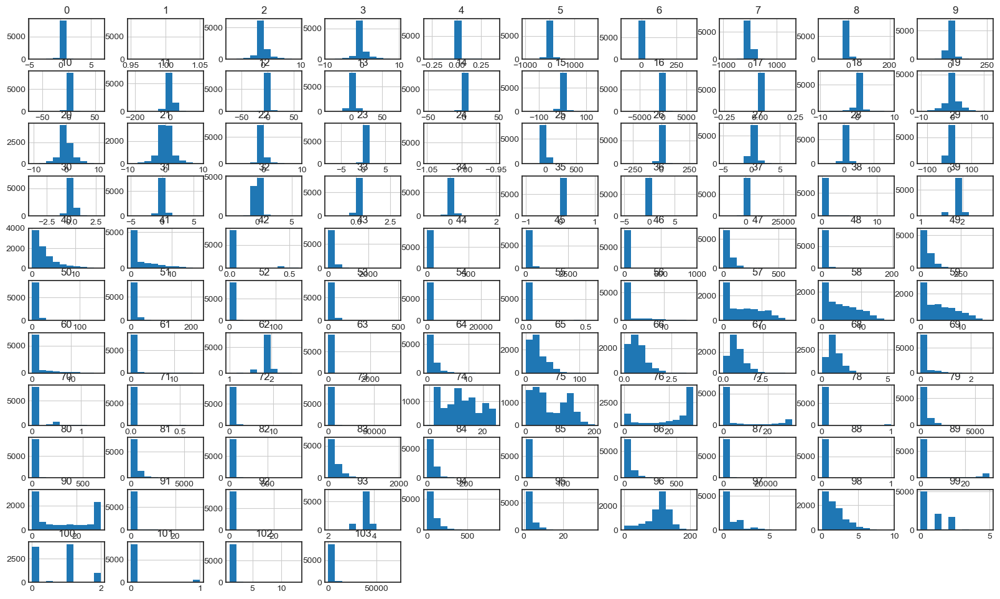

In [63]:
features = list(set(X_train.columns))
X_train[features].hist(figsize=(20,12));

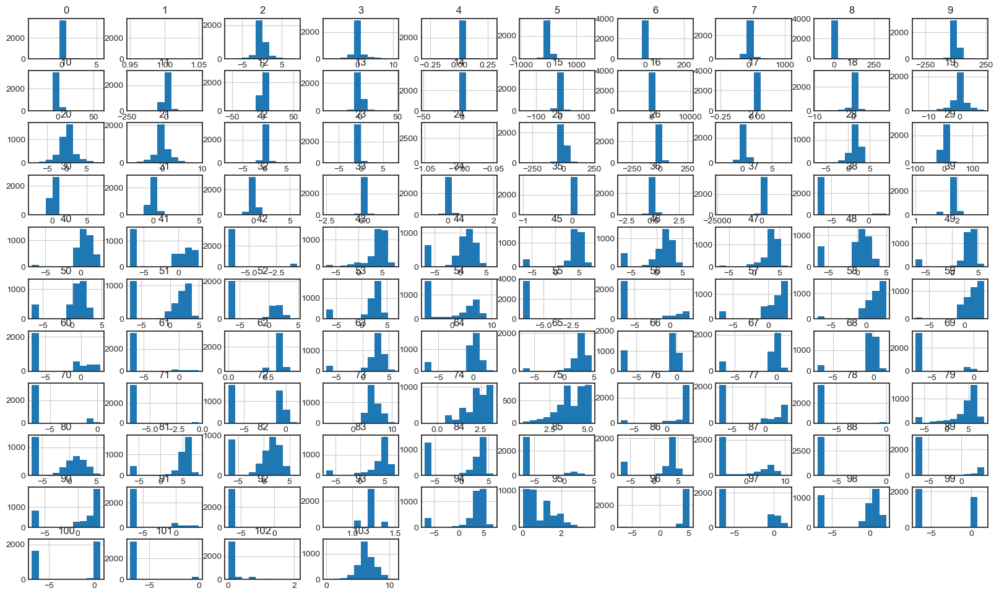

In [72]:
features = list(set(X_valid.columns))
X_valid[features].hist(figsize=(20,12));

In [71]:
#приводим распределение к нормальному

a = 0.001

for i in [28, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 
          65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80,
          81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99,
          100, 101, 102, 103]:
    if i in X_train.columns:
         X_train[i] = np.log(X_train[i] + a)

for i in [28, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 
          65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80,
          81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99,
          100, 101, 102, 103]:
    if i in X_valid.columns:
        X_valid[i] = np.log(X_valid[i] + a)

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.
C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in log


In [73]:
# Стандартизация приводим к единому масштабу еще способ
# выделяем количественные переменные в отдельный список
num_cols = [c for c in X_train.columns if X_train[c].dtype.name != 'object']
# создаем копию обучающего набора
X_train_copy = X_train.copy()
# выполняем стандартизацию
for i in num_cols:    
    X_train[i] = (X_train[i] - X_train[i].min()) / (X_train[i].max() - X_train[i].min())
    X_valid[i] = (X_valid[i] - X_train_copy[i].min()) / (X_train_copy[i].max() - X_train_copy[i].min())

In [76]:
columns = [28]
X_train.drop(columns, axis=1, inplace=True)
X_valid.drop(columns, axis=1, inplace=True)

In [80]:
columns = [74]
X_train.drop(columns, axis=1, inplace=True)
X_valid.drop(columns, axis=1, inplace=True)

In [113]:
# Стандартизация приводим к единому масштабу
# выделяем количественные переменные в отдельный список
num_cols = [c for c in X_train.columns if X_train[c].dtype.name != 'object']
# создаем копию обучающего набора
X_train_copy = X_train.copy()
# выполняем стандартизацию
for i in num_cols:    
    X_train[i] = (X_train[i] - X_train[i].mean()) / X_train[i].std()
    X_valid[i] = (X_valid[i] - X_train_copy[i].mean()) / X_train_copy[i].std()

In [84]:
logreg = LogisticRegression().fit(X_train, y_train)
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, logreg.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))
# качество незначительно упало нормализацию надо делать отдельно для каждой фичи с подбором подхода кубический квадратный корни логарифм

AUC на обучающей выборке: 0.757
AUC на контрольной выборке: 0.755


In [85]:
from sklearn.ensemble import RandomForestClassifier
# создаем экземпляр класса RandomForestClassifier
forest=RandomForestClassifier(n_estimators=800, max_depth=17, 
                              random_state=152, n_jobs=-1, oob_score=True)
# строим модель
forest.fit(X_train, y_train)
# оцениваем дискриминирующую способность 
# модели случайного леса
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, forest.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, forest.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 1.000
AUC на контрольной выборке: 0.734


In [87]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score


knn_pipe = Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(n_jobs=-1))])

knn_params = {'knn__n_neighbors': range(1, 10)}

knn_grid = GridSearchCV(knn_pipe, knn_params,
cv=5, n_jobs=-1,
verbose=True)

knn_grid.fit(X_train, y_train)

knn_grid.best_params_, knn_grid.best_score_

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  2.7min finished


({'knn__n_neighbors': 8}, 0.9176548819683032)

In [88]:
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, knn_grid.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, knn_grid.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 0.875
AUC на контрольной выборке: 0.604


In [61]:
#Готовим посылку по Catboost  еще в разработке
Test_label = pd.read_csv("D:\Python\Task_BigDataSchool\BigDataSchool3\BigDataSchool_test_set.csv", sep=",")

In [62]:
data_test = Train.merge(Test_label)

In [63]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4305 entries, 0 to 4304
Columns: 106 entries, ID to TARGET
dtypes: float64(105), int64(1)
memory usage: 3.5 MB


In [64]:
data_test.describe()

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F8slope,F9slope,F11slope,F12slope,F14slope,F15slope,F17slope,F18slope,F19slope,F20slope,F21slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F8dev,F9dev,F11dev,F12dev,F14dev,F15dev,F17dev,F18dev,F19dev,F20dev,F21dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F36dev,F37dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F8med,F9med,F11med,F12med,F18med,F19med,F20med,F21med,F24med,F26med,F27med,F30med,F31med,F32med,F36med,F37med,F39med,F40med,F41med,F43med,F44med,F45med,F46med,F47med,TARGET
count,4305.000000,4305.000000,4.305000e+03,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.0,4283.000000,4285.000000,4018.000000,4015.000000,3938.000000,3934.000000,3935.000000,3936.000000,3796.000000,3801.000000,3800.000000,3886.000000,3891.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4285.000000,4018.000000,3938.000000,3934.000000,3935.000000,3936.000000,3796.000000,3801.000000,3800.000000,3886.000000,3891.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4305.000000,4304.000000,4095.000000,3999.000000,4001.000000,3997.000000,3880.000000,3881.000000,3883.000000,3954.000000,3953.000000,0.0
mean,10234.606736,-0.013008,1.000000e+00,0.010773,0.103786,0.000029,5.521641,0.429854,4.517093,0.430807,0.050331,0.141246,0.510353,0.221317,0.862395,0.057568,0.960349,31.209732,-0.000110,-0.051686,-0.048150,0.019321,-0.020649,0.048182,0.008683,-1.0,0.152327,-0.973684,0.269505,4.865983,0.725629,-0.007590,-0.022241,-0.042458,-0.009655,0.016134,0.002612,0.004633,59.779040,0.356913,1.870742,3.096698,2.893931,0.041866,164.980117,7.341713,146.064716,10.065274,48.353619,4.466305,39.717473,5.052729,9.475123,2.901822,20.527364,269.336530,0.008211,1.972963,5.238312,5.246981,4.994714,1.530934,0.385013,1.865120,27.286855,1.330220,21.778815,0.626596,0.846618,0.984084,0.118540,0.090889,0.015474,0.371224,810.307498,12.021951,73.525203,21.336121,6.686643,0.025552,395.222783,8.142951,375.963120,11.064966,166.653542,23.439431,1.601211,43.393321,314.449791,0.000813,4.475377,13.432869,1.079675,0.218351,3.500348,73.776022,3.214530,104.187422,0.820670,1.606580,0.750000,0.621232,0.064383,1.195119,1454.108399,NaN
std,5500.160235,0.443163,5.496678e-17,1.549943,1.781479,0.038466,95.647475,4.910610,83.185421,6.417354,23.791864,2.892668,19.343762,3.111390,4.808390,2.866435,10.376481,310.815156,0.015288,1.548466,2.258717,2.125268,2.012719,1.095417,0.525865,0.0,29.571444,23.949660,0.643480,8.718359,10.920077,0.356292,0.431522,0.481077,0.144480,0.117841,0.041904,0.252430,872.721036,1.342212,0.114448,3.015313,3.831822,0.133207,223.825027,13.458019,188.169361,18.333063,48.114583,7.188737,37.120334,7.425330,12.861369,8.398191,24.747456,916.997752,0.059641,3.796750,4.365974,4.033500,3.911404,3.080117,1.660735,0.122171,35.937672,1.220708,16.608390,0.533120,0.567509,0.568835,0.287567,0.219769,0.086827,0.519016,1864.401114,6.509826,49.313403,10.912951,10.647658,0.151425,514.234433,23.894691,413.334661,27.628405,176.144204,27.577514,5.538006,48.542080,1281.861437,0.025264,9.678173,12.221119,3.950824,1.938066,0.276794,81.622558,2.966524,35.364214,1.

In [65]:
data_test

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F8slope,F9slope,F11slope,F12slope,F14slope,F15slope,F17slope,F18slope,F19slope,F20slope,F21slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F8dev,F9dev,F11dev,F12dev,F14dev,F15dev,F17dev,F18dev,F19dev,F20dev,F21dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F36dev,F37dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F8med,F9med,F11med,F12med,F18med,F19med,F20med,F21med,F24med,F26med,F27med,F30med,F31med,F32med,F36med,F37med,F39med,F40med,F41med,F43med,F44med,F45med,F46med,F47med,TARGET
0,1,0.000000,1.0,2.257143e+00,2.285714e-01,0.000000,20.404000,1.890286e+00,1.881757,0.872000,2.870000e+01,1.200000e+00,3.600000,8.571429e-02,4.883721e+00,6.216216e-01,2.592286,7.562571e-02,0.000000,-2.028571,-6.756757e-02,0.400000,6.857143e-01,0.000000,0.000000e+00,-1.0,4.527027,-2.959459e+00,-0.057143,10.514286,1.714286,-1.714286e-01,-1.142857e-01,1.714286e-01,0.514286,-0.244186,0.000000,2.285714e-01,61.175676,0.000000,2.073644,6.090977,1.032796,0.000000,62.721373,17.142441,34.817318,9.065386,52.869651,19.085771,14.859340,7.026142,10.954451,2.489980,16.968974,1.019076,0.000000,12.802344,12.389512,7.527727,4.226898,0.000000,0.000000,1.581139,16.361540,2.065591,4.898979,1.095445,0.516398,0.816497,1.095445,0.547723,0.000000,0.516398,159.054393,9.0,140.0,18.5,0.0,0.0,52.730,19.115,83.670,29.475,60.0,0.000,2.000,25.560,0.000000,0.0,7.0,23.0,0.0,0.0,4.0,32.0,10.0,147.0,1.0,2.0,1.0,1.0,0.0,2.0,341.0,NaN
1,3,0.000000,1.0,2.857143e-01,-1.742857e+00,0.000000,-20.963143,-6.305714e-01,18.074571,-0.013714,1.142857e-01,-3.142857e-01,-1.028571,-5.714286e-02,2.700000e+00,-2.857143e-01,3.669651,-9.326431e+01,0.000000,0.000000,-1.662791e+00,-0.800000,5.714286e-02,0.000000,0.000000e+00,-1.0,-2.085714,3.285714e+00,0.142857,-4.542857,-15.100000,0.000000e+00,0.000000e+00,8.571429e-02,0.000000,0.000000,0.000000,4.186047e-01,-420.391892,0.000000,1.870829,1.211060,6.892024,0.000000,94.685217,3.266769,173.606064,0.116733,22.730303,2.562551,23.191953,0.816497,8.485281,0.816497,13.023129,262.838529,0.000000,0.000000,8.927486,6.396614,3.881580,0.000000,0.000000,1.581139,11.588788,1.169045,26.696442,0.000000,0.000000,0.408248,0.000000,0.000000,0.000000,1.341641,1771.354199,5.0,37.5,29.5,2.0,0.0,258.920,0.360,702.275,0.065,128.5,12.000,0.000,17.000,1.652592,0.0,0.0,14.0,0.0,0.0,3.0,60.0,4.5,130.0,0.0,0.0,0.0,1.0,0.0,1.0,527.0,NaN
2,6,0.000000,1.0,-1.714286e-01,1.000000e-01,0.000000,-63.029429,1.387779e-18,11.091000,-2.814000,-1.460000e+01,8.571429e-02,0.514286,7.300000e+00,0.000000e+00,0.000000e+00,-0.105714,9.099100e-03,0.000000,0.000000,4.457143e+00,-1.457143,-1.714286e-01,0.000000,0.000000e+00,-1.0,2.600000,-2.857143e+00,0.314286,-0.430233,1.600000,0.000000e+00,-4.285714e-01,-8.571429e-02,0.000000,0.000000,0.000000,0.000000e+00,-15.400000,0.000000,2.073644,1.095445,0.500000,0.000000,171.936708,0.102859,104.289194,14.391839,30.505191,1.224745,14.528134,13.809417,0.000000,0.000000,1.677796,0.020820,0.000000,0.000000,10.334409,3.544949,1.211060,0.000000,0.000000,1.870829,12.231108,2.041241,7.201852,0.000000,1.224745,1.643168,0.000000,0.000000,0.000000,0.000000,33.772277,10.0,115.0,30.0,0.0,0.0,803.670,0.000,393.600,10.900,153.0,30.000,0.000,31.150,0.000000,0.0,0.0,7.5,0.0,0.0,3.5,40.0,5.5,116.0,0.0,0.0,1.0,0.0,0.0,1.0,279.5,NaN
3,7,0.000000,1.0,-2.500000e+00,2.857143e-01,0.000000,-3.394286,-2.445714e-01,-12.287429,0.024286,-5.314286e+00,-2.441860e-01,-7.942857,3.372093e-01,0.000000e+00,0.000000e+00,0.000000,3.107900e+00,0.000000,0.000000,7.714286e-01,0.485714,2.000000e-01,0.000000,0.000000e+00,-1.0,-7.651163,1.428571e+00,0.121622,-0.514286,-2.771429,9.302326e-02,4.651163e-02,-2.285714e-01,0.000000,0.000000,0.000000,5.714286e-02,-3.457143,0.000000,1.870829,4.847680,4.082483,0.00000

In [66]:
data_test.isnull().sum()

ID             0
F1slope        0
F2slope        0
F3slope        0
F4slope        0
F5slope        0
F6slope        0
F8slope        0
F9slope        0
F11slope       0
F12slope       0
F14slope       0
F15slope       0
F17slope       0
F18slope       0
F19slope       0
F20slope       0
F21slope       0
F24slope       0
F26slope       0
F27slope       0
F28slope       0
F29slope       0
F30slope       0
F31slope       0
F32slope       0
F35slope      22
F36slope      20
F37slope     287
F38slope     290
F39slope     367
F40slope     371
F41slope     370
F42slope     369
F43slope     509
F44slope     504
F45slope     505
F46slope     419
F47slope     414
F1dev          0
F2dev          0
F3dev          0
F4dev          0
F5dev          0
F6dev          0
F8dev          0
F9dev          0
F11dev         0
F12dev         0
F14dev         0
F15dev         0
F17dev         0
F18dev         0
F19dev         0
F20dev         0
F21dev         0
F24dev         0
F26dev         0
F27dev        

In [67]:
#ипутация пропусков
for i in ['F36med', 'F37med', 'F39med', 'F40med', 'F41med', 'F43med', 'F44med', 'F45med', 'F46med', 'F47med',  
         'F36dev', 'F37dev', 'F39dev', 'F40dev', 'F41dev', 'F42dev', 'F43dev', 'F44dev', 'F45dev', 'F46dev', 'F47dev',
          'F35slope', 'F36slope', 'F37slope', 'F38slope', 'F39slope', 'F40slope', 'F41slope', 'F42slope', 'F43slope',
        'F44slope', 'F45slope', 'F46slope', 'F47slope']:
    if i in data_test.columns:
         data_test[i].fillna(data_test[i].median(), inplace=True)

In [71]:
test = data_test.drop(['ID'], axis=1, inplace=True)

In [72]:
#посылка



submission = pd.DataFrame()
submission['ID'] = test['ID']
submission['TARGET'] = model.predict(test)
submission.head()

TypeError: 'NoneType' object is not subscriptable